In [19]:
import os
import pandas as pd
import scanpy as sc
import numpy as np

file_dir = "/Users/firoj.mahmud/Library/CloudStorage/OneDrive-KarolinskaInstitutet/Mac/Documents/PC_CYST_Manuscript/SCrnaSEQ_data_PCcysts/OneDrive_1_2024-03-25"
file_paths = [
    "AM31-Combine-1to8_S1.counts.umiCounts.table.csv",
    "AM72_Combine_S1.counts.umiCounts.aboveBackground.table.csv",
    "MK300_Combine_S1.counts.umiCounts.aboveBackground.table.csv",
    "AM48_Combine_S1.counts.umiCounts.aboveBackground.table.csv",
    "AM86_combine_S1.counts.umiCounts.aboveBackground.table.csv",
    "RS01-Combined_S1.counts.umiCounts.aboveBackground.table.csv"
]
#AM31: LG.IPMN1
#AM86: LG.IPMN2
#AM48: HG.IPMN1
#AM72: HG.IPMN2
#MK300: PDAC1
#RS01: PDAC2
# Create metadata DataFrame
metadata_df = pd.DataFrame({
    'Sample_ID': ['AM31-Combine-1to8_S1', 'AM72_Combine_S1', 'MK300_Combine_S1',
                  'AM48_Combine_S1', 'AM86_combine_S1', 'RS01-Combined_S1'],
    'patients': ['LG.IPMN1', 'HG.IPMN2', 'PDAC1', 'HG.IPMN1', 'LG.IPMN2', 'PDAC2'],
    'Condition': ['LG',  'HG','PDAC', 'HG', 'LG', 'PDAC']
})

# Initialize list to hold AnnData objects
adata_list = []
sample_ids = metadata_df['Sample_ID'].tolist()

for file_name, sample_id in zip(file_paths, sample_ids):
    file_path = os.path.join(file_dir, file_name)
    adata_temp = sc.read_csv(file_path, first_column_names=True)
    adata_temp.obs['Sample_ID'] = sample_id
    adata_list.append(adata_temp)

adata = sc.concat(adata_list, label='batch', keys=sample_ids)

metadata_df.set_index('Sample_ID', inplace=True)

for sample_id in adata.obs['Sample_ID'].unique():
    idx = adata.obs['Sample_ID'] == sample_id
    adata.obs.loc[idx, 'patients'] = metadata_df.loc[sample_id, 'patients']
    adata.obs.loc[idx, 'Condition'] = metadata_df.loc[sample_id, 'Condition']



/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [24]:
save_dir = "/Users/firoj.mahmud/Library/CloudStorage/OneDrive-KarolinskaInstitutet/Mac/Documents/PC_CYST_Manuscript/SCrnaSEQ_data_PCcysts"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Define the file name without the extension
file_name = "plot"

In [25]:
results_file = "/Users/firoj.mahmud/Library/CloudStorage/OneDrive-KarolinskaInstitutet/Mac/Documents/PC_CYST_Manuscript/SCrnaSEQ_data_PCcysts/OneDrive_1_2024-03-25/pcCYST2.h5ad"# the file that will store the analysis results

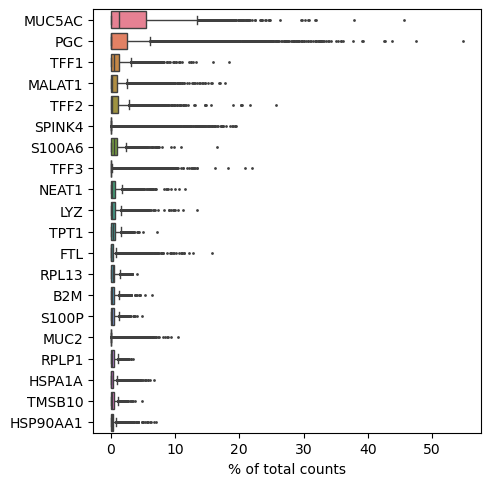

In [27]:

sc.pl.highest_expr_genes(adata, n_top=20, save='.pdf')


In [29]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=2)

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


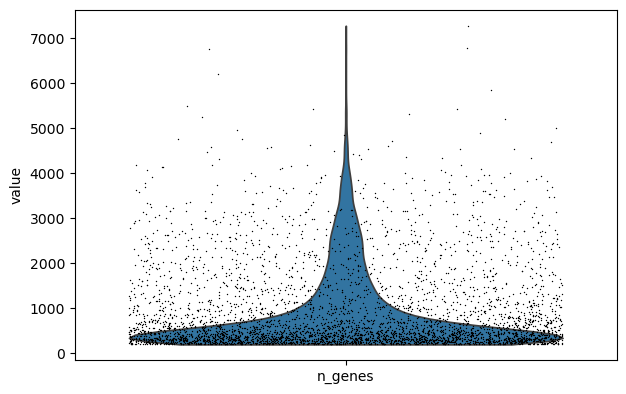

In [10]:
import scanpy as sc

# quality control metric 
qc_metric = "n_genes"

# Plot the violin plot
sc.pl.violin(
    adata,
    keys=qc_metric,
    jitter=0.4,  # Adjust the amount of jitter for better visualization
    multi_panel=False, save='.pdf' # Display all cells in a single panel
)



In [13]:
adata.obs['total_counts'] = adata.X.sum(axis=1)

mt_genes = [gene.startswith('MT-') for gene in adata.var_names]  # Assuming mitochondrial genes start with 'MT-'
adata.obs['pct_counts_mt'] = np.sum(adata[:, mt_genes].X, axis=1) / adata.obs['total_counts'] * 100


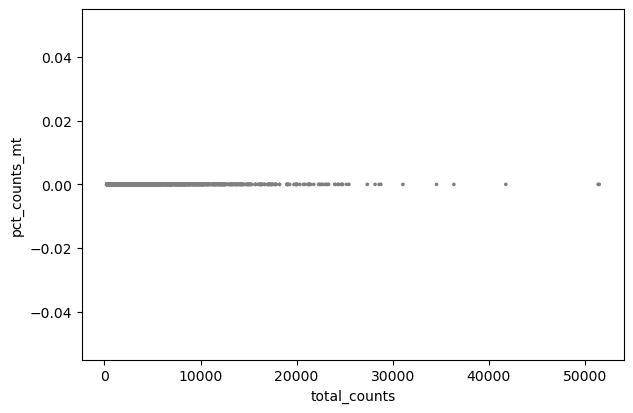

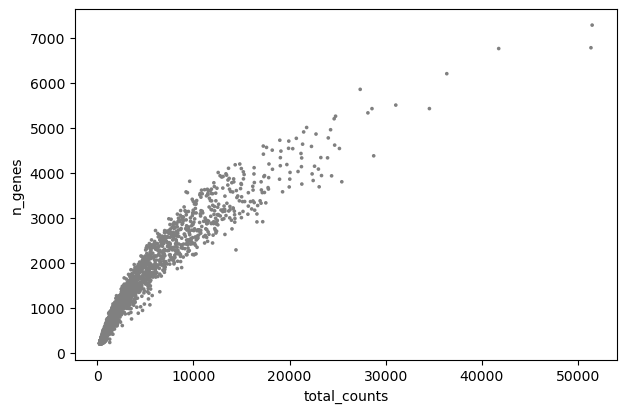

In [17]:
sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt")

sc.pl.scatter(adata, x="total_counts", y="n_genes",save='.pdf')


In [18]:
adata = adata[adata.obs.n_genes < 1500, :]
adata = adata[adata.obs.pct_counts_mt < 3, :].copy()

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [19]:
sc.pp.log1p(adata)

In [20]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

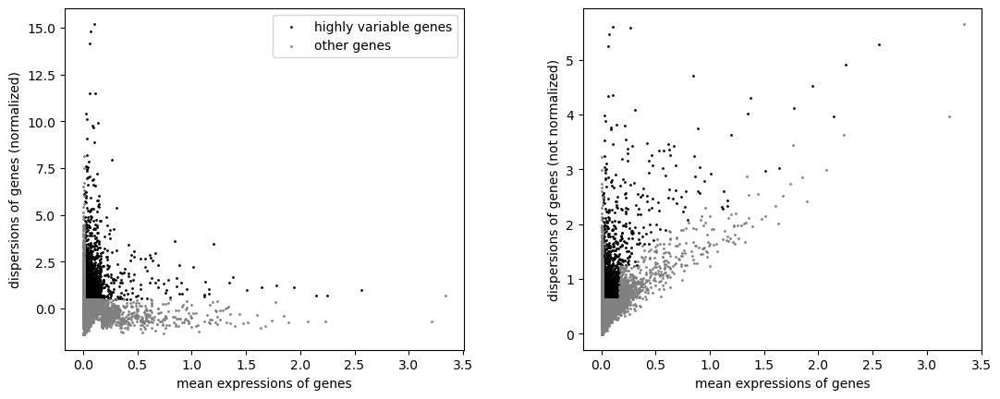

In [21]:
sc.pl.highly_variable_genes(adata, save='highlyvariableGenes.pdf')

In [178]:
#sc.pl.highly_variable_genes(adata)

In [22]:
sc.pp.normalize_total(adata, target_sum=1e4)

In [23]:
adata.raw = adata

In [24]:
adata = adata[:, adata.var.highly_variable]

In [25]:
sc.pp.regress_out(adata, ["total_counts", "pct_counts_mt"])

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [26]:
sc.pp.scale(adata, max_value=10)

In [27]:
sc.tl.pca(adata, svd_solver="arpack")

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


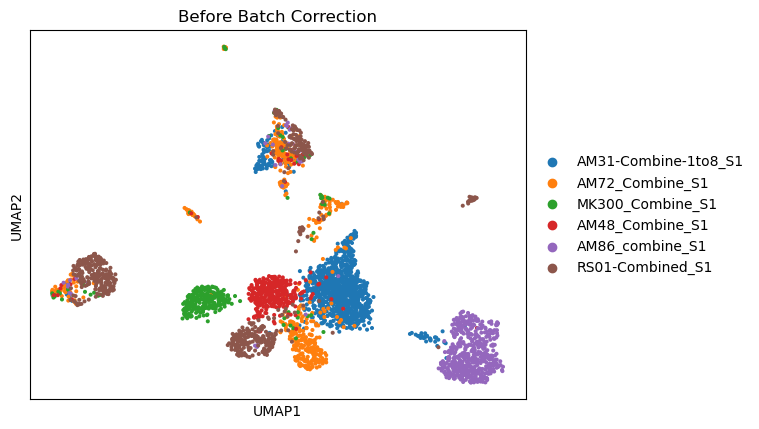

In [28]:

sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color='batch', title='Before Batch Correction')

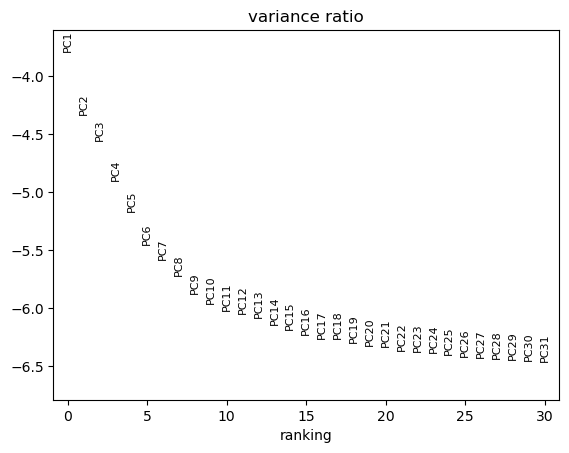

In [30]:
sc.pl.pca_variance_ratio(adata, log=True,save='variancegenes.pdf')

In [35]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

In [36]:
sc.tl.umap(adata)

In [192]:
#sc.pl.umap(adata, color=["ARPC3", "ARPC2","ARPC4","ARPC5", "ACTB","ACTR3", "ACTG1","ARPC1B"])

In [39]:
#sc.pl.umap(adata, color=["ARPC3", "ARPC2","ARPC4","ARPC5", "ACTB","ACTR3", "ACTG1","ARPC1B"],cmap="Reds", save='ARPcomplex.pdf')

In [40]:

sc.tl.leiden(
    adata,
    resolution=0.9,
    random_state=0,
    n_iterations=2,
    directed=False,
)

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


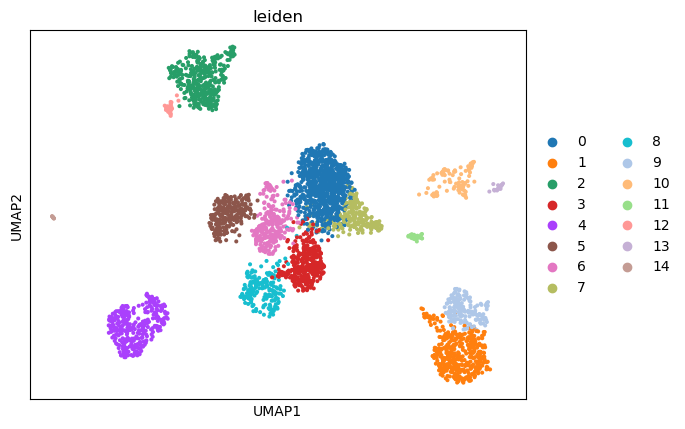

In [41]:
sc.pl.umap(adata, color=["leiden"],save='leidenUMAPcluster.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


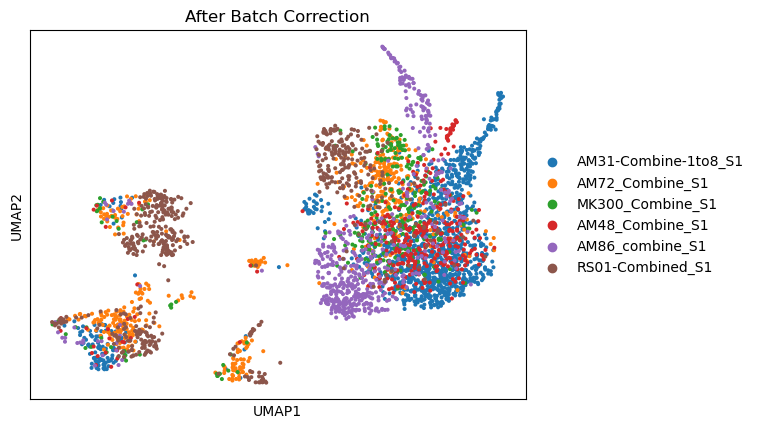

In [43]:
# Batch correction using Combat
sc.pp.combat(adata, key='batch')
#sce.pp.harmony_integrate(adata, 'batch')
# Recompute PCA and UMAP after batch correction
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata)

# Plot UMAP colored by batch after correction
sc.pl.umap(adata, color='batch', title='After Batch Correction')

In [198]:
####NOW we have to do cell typing mannually, Before that check the classical cell type and the paper cell typing  

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


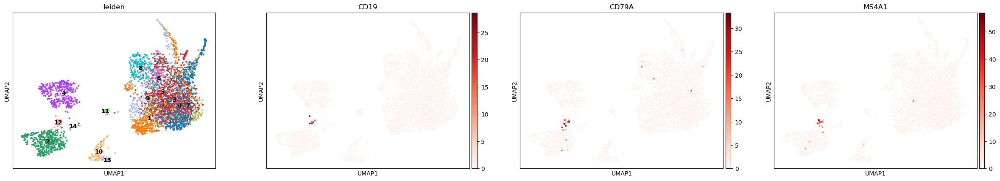

In [44]:
####B cell B cell: 'CD19', 'CD79A','CD79B','MS4A1'
sc.pl.umap(adata, color=["leiden","CD19", "CD79A","MS4A1"],cmap="Reds",legend_loc='on data'
    ,save='Bcell_marker.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


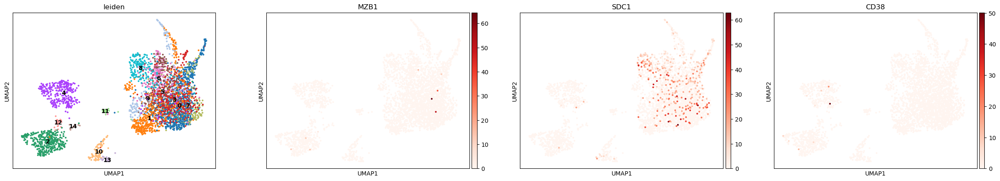

In [45]:
####plasma cell: 'IGHG1', 'MZB1', 'SDC1','IGHG4','CD38'
sc.pl.umap(adata, color=["leiden","MZB1", "SDC1","CD38",],cmap="Reds",legend_loc='on data'
  ,save='Plasma_cell_marker.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


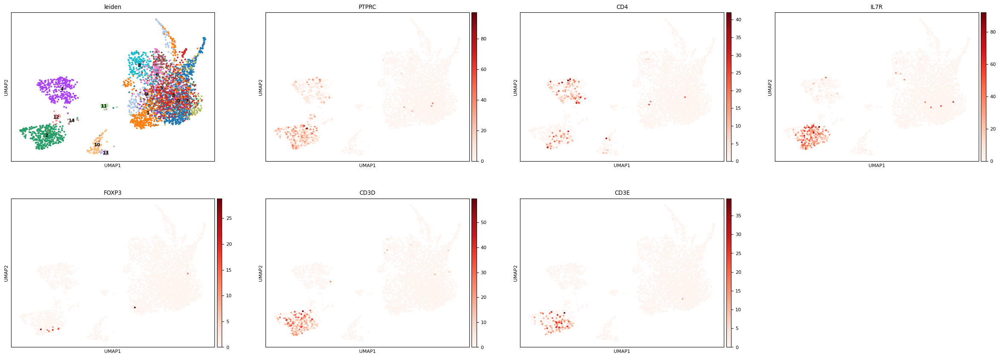

In [201]:
##CD4T
sc.pl.umap(adata, color=["leiden", "PTPRC", "CD4", "IL7R", "FOXP3", "CD3D", "CD3E"], cmap="Reds",legend_loc='on data',save='CD4_cell_marker.pdf')


/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


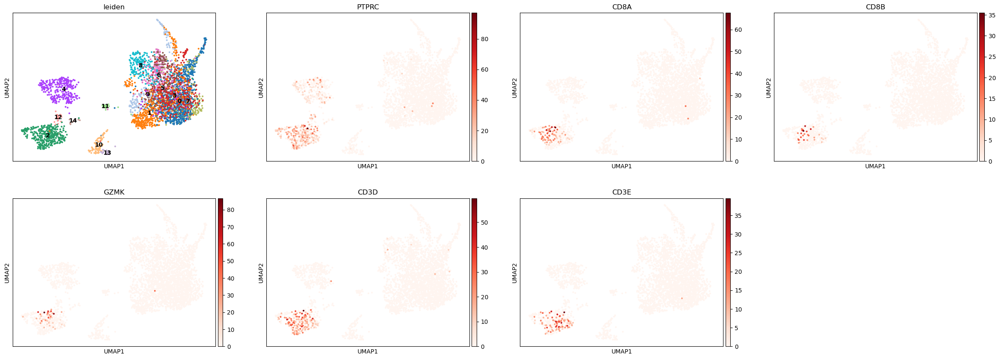

In [46]:
##CD8. TCELL cluster 2
sc.pl.umap(adata, color=["leiden", "PTPRC", "CD8A", "CD8B", "GZMK", "CD3D", "CD3E"], cmap="Reds",legend_loc='on data',save='CD8_cell_marker.pdf')


/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


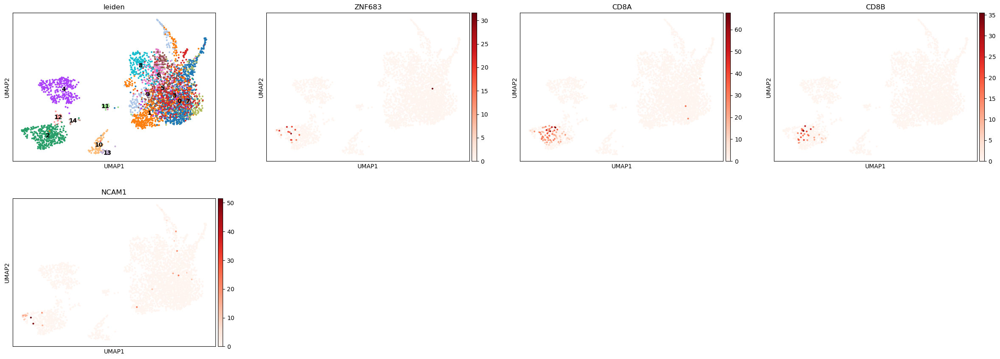

In [47]:
###NKT cells NOT present:##CD3 not present #CD56. Cluster 2
sc.pl.umap(adata, color=["leiden", "ZNF683", "CD8A", "CD8B", "NCAM1"], cmap="Reds", legend_loc='on data',save='NKT_cell_marker.pdf')


/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


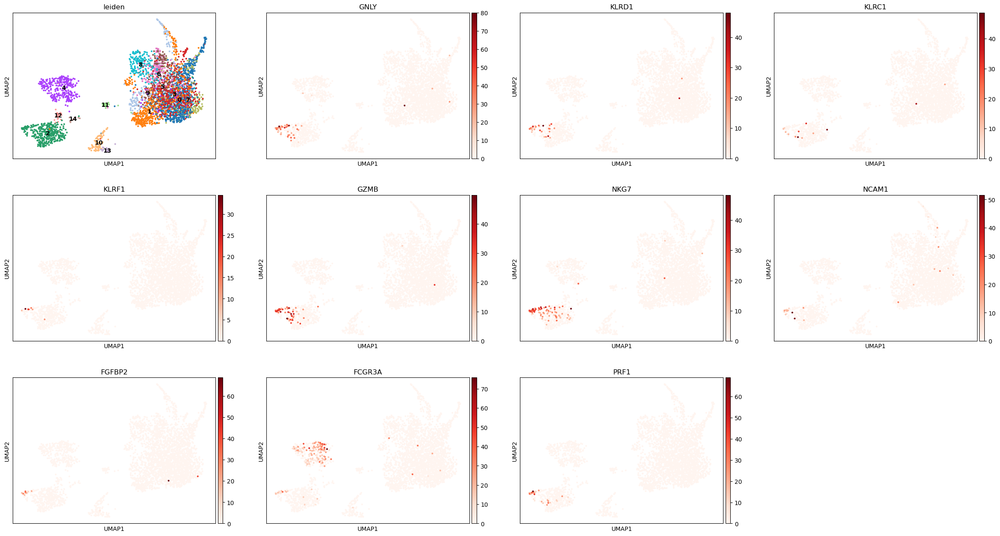

In [48]:
#NK cells NP: "HAVR2C" "NCR1", Cluster 2 NK cells
sc.pl.umap(adata, color=["leiden", "GNLY", "KLRD1", "KLRC1", "KLRF1", "GZMB", "NKG7", "NCAM1",  "FGFBP2", "FCGR3A", "PRF1"], cmap="Reds",legend_loc='on data',save='NK_cell_marker.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


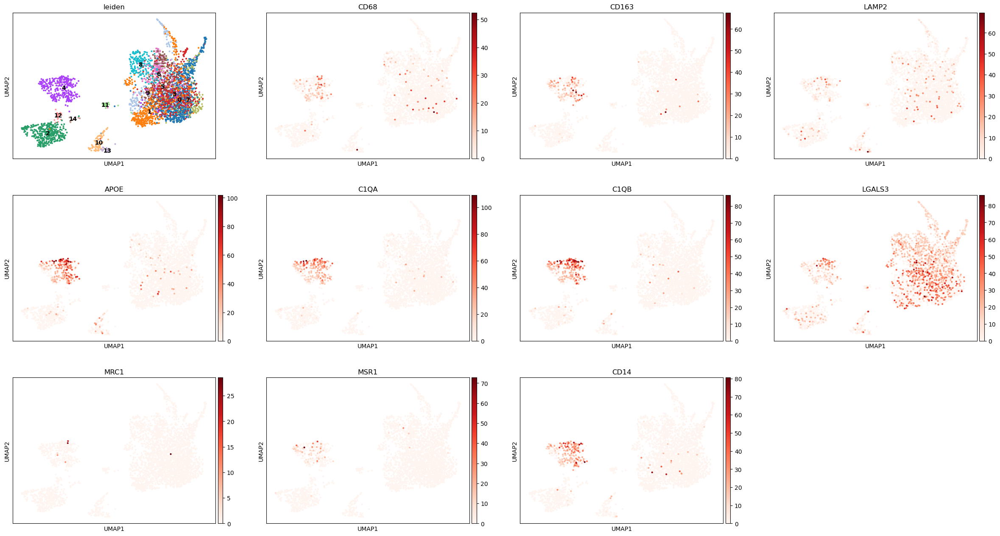

In [49]:
##Macrophage "ITGMX", CD11C, CD11B Cluster 12 
sc.pl.umap(adata, color=["leiden", "CD68", "CD163", "LAMP2", "APOE", "C1QA", "C1QB",  "LGALS3", "MRC1", "MSR1", "CD14"], cmap="Reds",legend_loc='on data',save='Macrophage_cell_marker.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


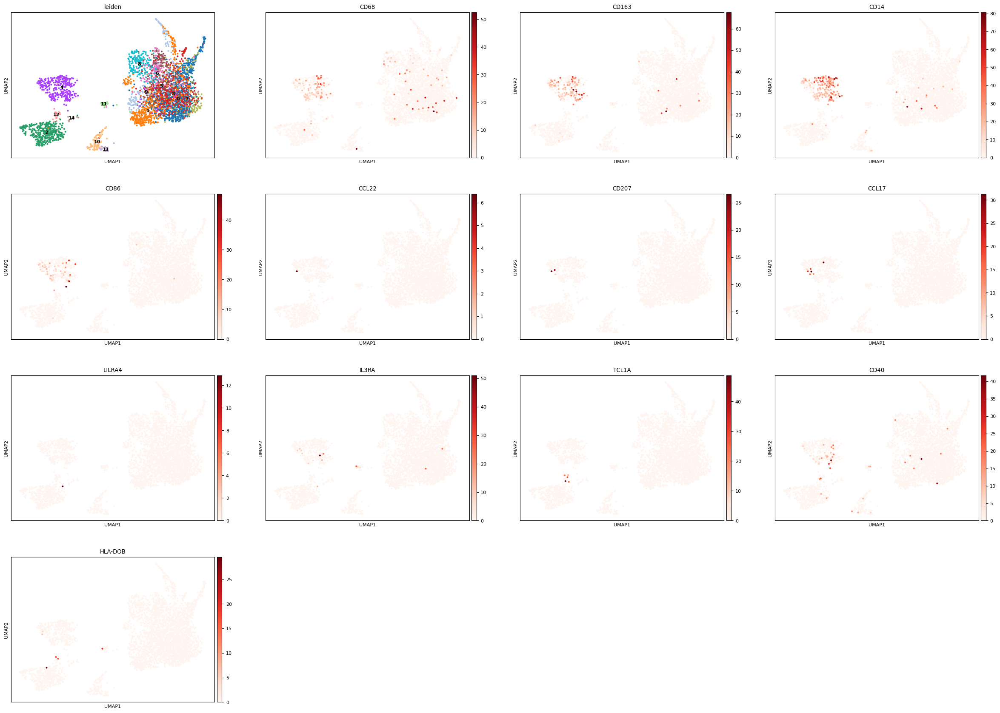

In [206]:
##DC. "CLEC4C",, "DOB"
sc.pl.umap(adata, color=["leiden", "CD68", "CD163", "CD14", "CD86", "CCL22", "CD207", "CCL17", "LILRA4", "IL3RA", "TCL1A",  "CD40", "HLA-DOB"], cmap="Reds",legend_loc='on data',save='Dendritic_cell_marker.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


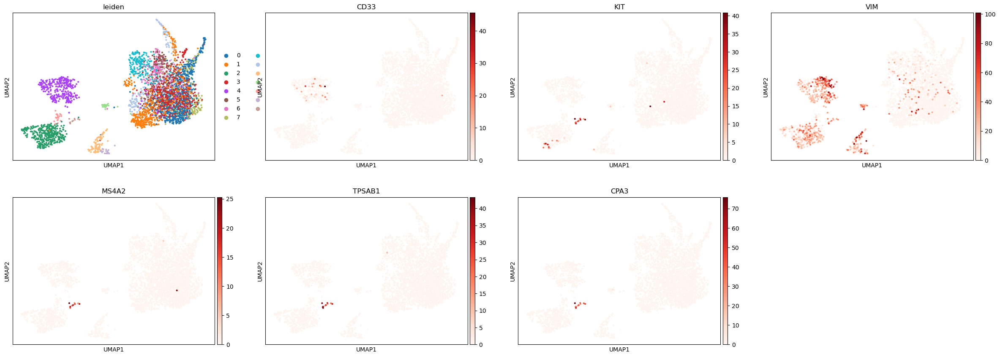

In [50]:
##Mast cell
sc.pl.umap(adata, color=["leiden", "CD33", "KIT", "VIM", "MS4A2", "TPSAB1", "CPA3"], cmap="Reds",save='Mast_cell_marker.pdf')


/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


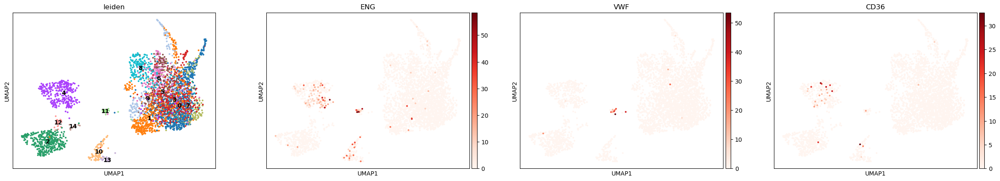

In [51]:
#Endothelial 4
sc.pl.umap(adata, color=["leiden", "ENG", "VWF", "CD36"], cmap="Reds",legend_loc='on data',save='Endothelial_cell_marker.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


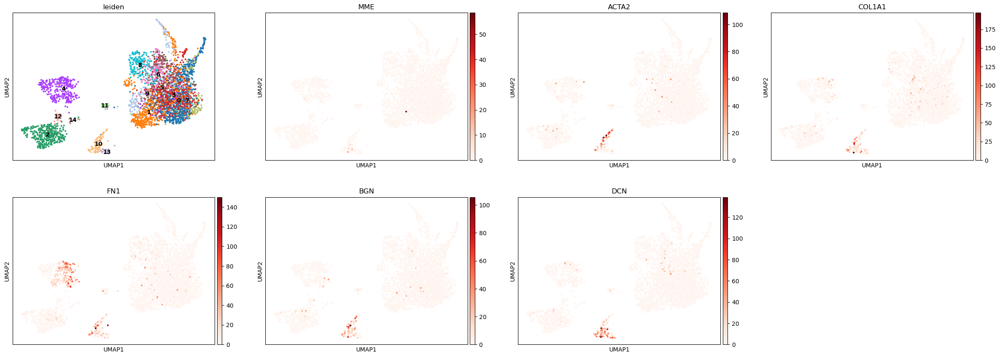

In [52]:
##Fibroblast. cluster 10 #CD10
sc.pl.umap(adata, color=["leiden", "MME",  "ACTA2", "COL1A1", "FN1", "BGN", "DCN"], cmap="Reds",legend_loc='on data',save='Fibroblast_cell_marker.pdf')

In [1]:
pwd()

'/Users/firoj.mahmud'

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


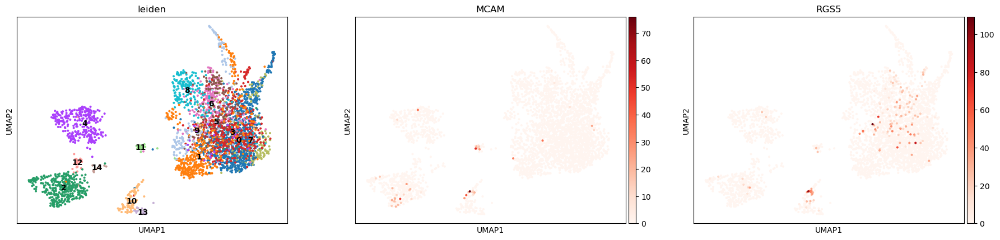

In [53]:
#pericite
sc.pl.umap(adata, color=["leiden", "MCAM", "RGS5"], cmap="Reds",legend_loc='on data',save='Pericite_cell_marker.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


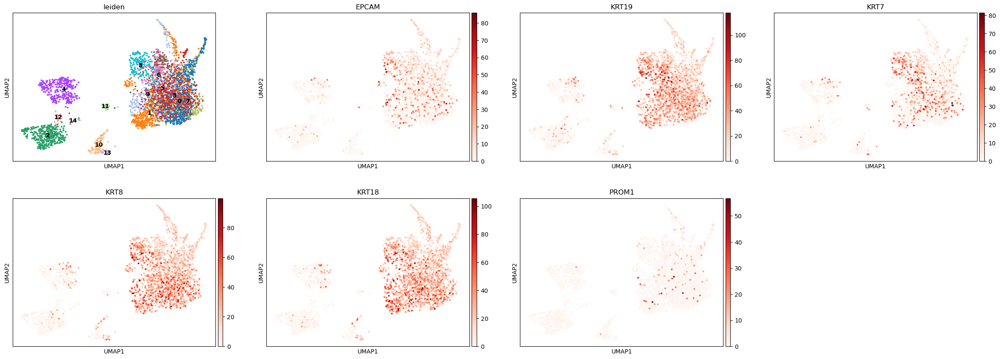

In [54]:
#epithelial 0,7,3,8,6,5
sc.pl.umap(adata, color=["leiden", "EPCAM", "KRT19", "KRT7", "KRT8", "KRT18", "PROM1"], cmap="Reds",legend_loc='on data',save='Epithelial_cell_marker.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


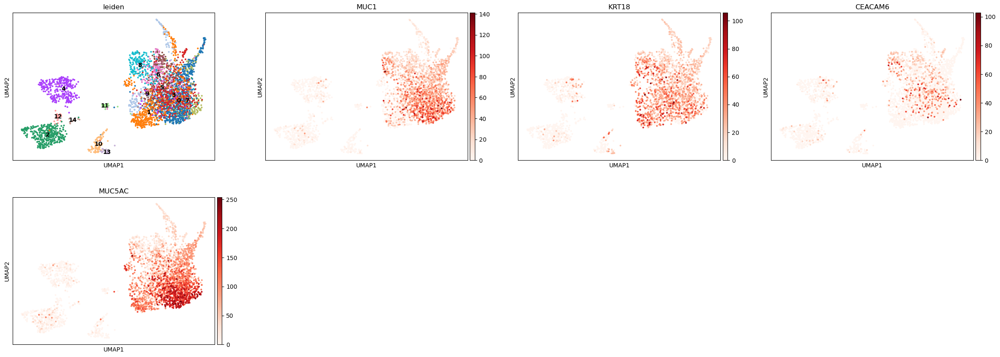

In [55]:
###paper celltype, Epithelial and adenocarcinoma
sc.pl.umap(adata, color=["leiden", "MUC1",  "KRT18", "CEACAM6", "MUC5AC"], cmap="Reds",legend_loc='on data',save='Paper_Epithelial_cell_marker.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


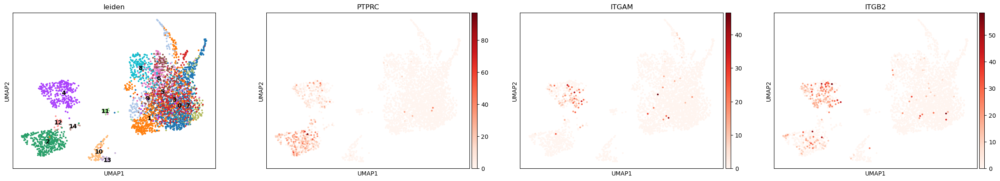

In [56]:
###paper celltype, Myeloid 
sc.pl.umap(adata, color=["leiden", "PTPRC",  "ITGAM", "ITGB2"], cmap="Reds",legend_loc='on data',save='Paper_Mayeloid_cell_marker.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


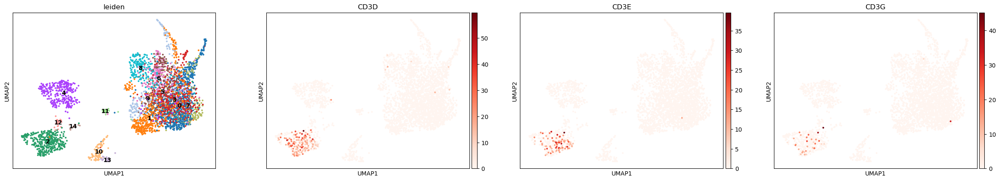

In [57]:
###Lymphocite
sc.pl.umap(adata, color=["leiden", "CD3D",  "CD3E", "CD3G"], cmap="Reds",legend_loc='on data',save='Paper_Lymphocite_cell_marker.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


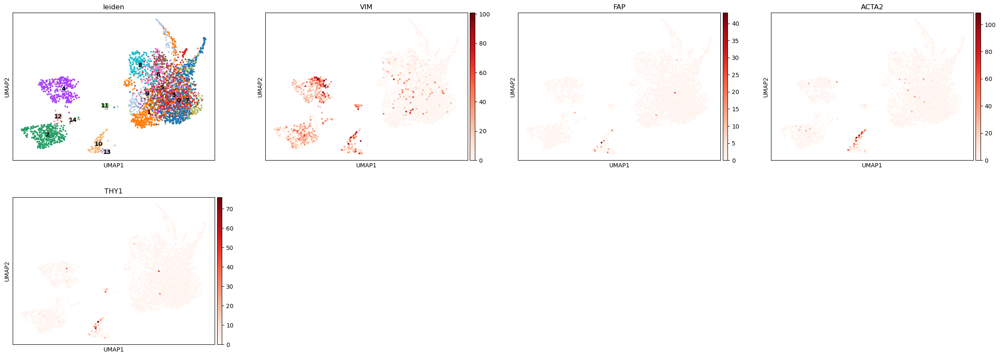

In [58]:
##Myofibroblast cluster 10 and 13
sc.pl.umap(adata, color=["leiden", "VIM",  "FAP", "ACTA2", "THY1"], cmap="Reds",legend_loc='on data',save='Paper_Myofibroblast_cell_marker.pdf')

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


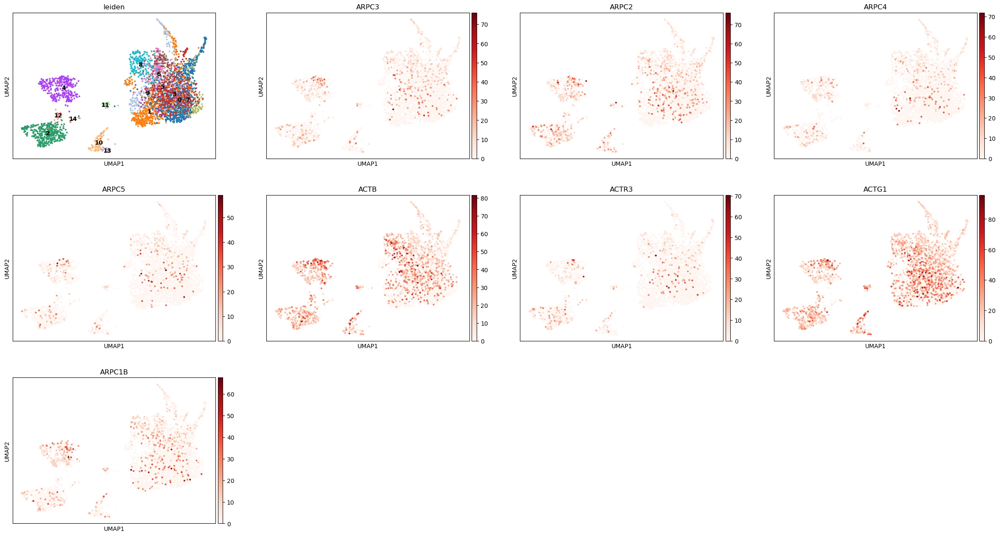

In [59]:
sc.pl.umap(adata, color=["leiden","ARPC3", "ARPC2","ARPC4","ARPC5", "ACTB","ACTR3", "ACTG1","ARPC1B"],cmap="Reds", legend_loc='on data',save='ARPC2complex_cell_marker.pdf')

In [ ]:
##marker genes
marker_genes = [
    ["CD19", "CD79A", "CD79B", "MS4A1"],  # B cells
    ["IGHG1", "MZB1", "SDC1", "IGHG4", "CD38"],  # Plasma cells
    ["PTPRC", "CD4", "IL7R", "FOXP3", "CD3D", "CD3E"],  # CD4 T cells
    ["PTPRC", "CD8A", "CD8B", "GZMK", "CD3D", "CD3E"],  # CD8 T cells
    ["ZNF683", "CD8A", "CD8B", "CD3", "NCAM1", "CD56"],  # NKT cells
    ["GNLY", "KLRD1", "KLRC1", "KLRF1", "GZMB", "NKG7", "NCAM1", "HAVR2C", "NCR1", "FGFBP2", "FCGR3A", "PRF1"],  # NK cells
    ["VCAN", "FCN1", "S100A12"],  # Monocytes
    ["CD68", "CD163", "LAMP2", "APOE", "C1QA", "C1QB", "ITGMX", "CD11C", "CD11B", "LGALS3", "MRC1", "MSR1", "CD14", "CD11B"],  # Macrophages
    ["CD68", "CD163", "CD14", "CD86", "CCL22", "CD207", "CCL17", "LILRA4", "IL3RA", "TCL1A", "CLEC4C", "CD40", "HLA-DOB", "DOB"],  # Dendritic cells
    ["CD33", "KIT", "VIM", "MS4A2", "TPSAB1", "CPA3"],  # Mast cells
    ["ENG", "VWF", "CD36"],  # Endothelial cells
    ["MME", "CD10", "ACTA2", "COL1A1", "FN1", "BGN", "DCN"],  # Fibroblasts
    ["MCAM", "RGS5"],  # Pericytes
    ["EPCAM", "KRT19", "KRT7", "KRT8", "KRT18", "PROM1"],  # Epithelial/Tumor cells
    ["S100B", "PLP1"]  # Neurons
]

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


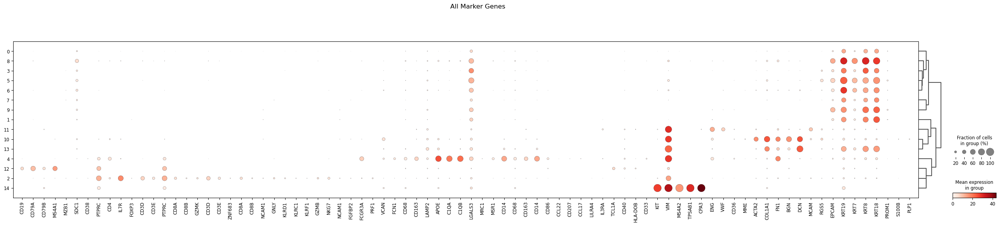

In [68]:
# Concatenate all marker genes into one list
all_marker_genes = [gene for genes in marker_genes for gene in genes]

# Plot the bubble plot with all marker genes
sc.pl.dotplot(adata, all_marker_genes, groupby="leiden", title="All Marker Genes", dendrogram=True,save='bubbleplots_markergenes.pdf')



/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


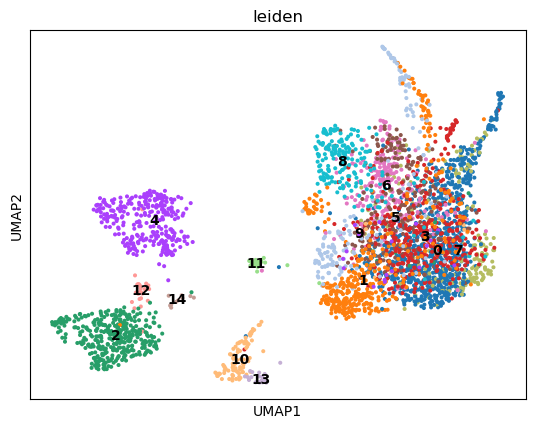

In [69]:
sc.pl.umap(adata, color="leiden", cmap="Reds",legend_loc='on data')

In [70]:
new_cluster_names = [
    "epithelial",#0
    "epithelial",#1
    "NK/myeloid/lymphosite",#2
    "epithelial",#3
    "macrophage",#4
    "epithelial",#5
    "epithelial",#6
    "epithelial",#7
    "epithelial",#8
    "other",#9
    "Fibroblast",#10
    "other",#11
    "other",#12
    "other",#13
]

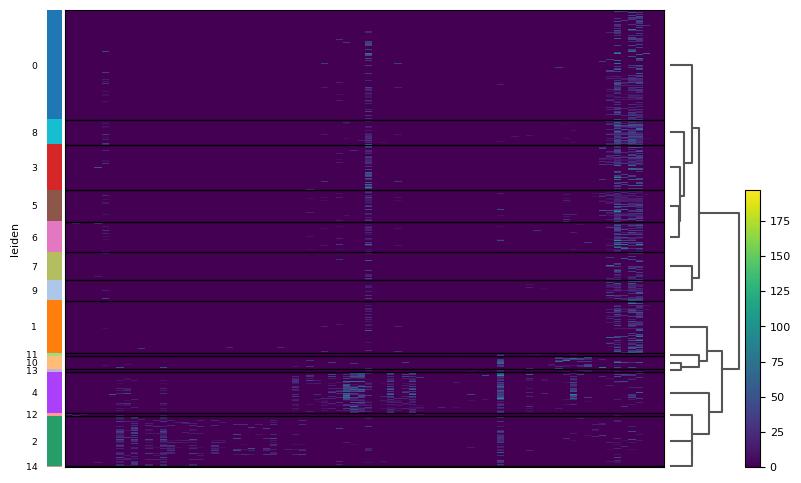

In [250]:
ax = sc.pl.heatmap(
    adata,all_marker_genes, groupby="leiden", cmap="viridis", dendrogram=True
)

In [251]:
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon")

ranking genes
    finished (0:00:05)


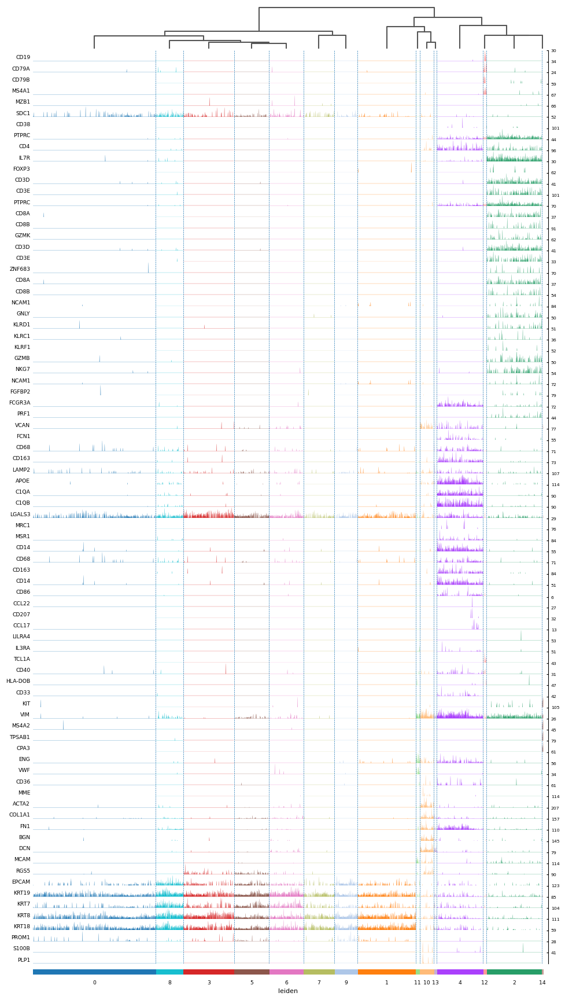

In [252]:
ax = sc.pl.tracksplot(adata, all_marker_genes, groupby="leiden", dendrogram=True)

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


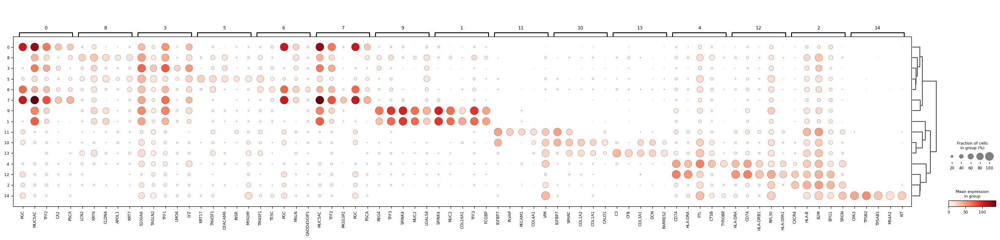

In [253]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5,save='differentail_genes_ranked_grouped.pdf') ###This function is really good to find the marker genes more precisely

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


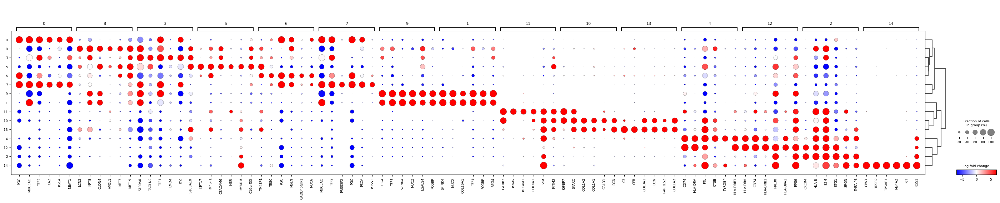

In [254]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=6,
    values_to_plot="logfoldchanges",
    min_logfoldchange=3,
    vmax=7,
    vmin=-7,
    cmap="bwr",save='differentail_genes_ranked_grouped_expresssion.pdf'
)

/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


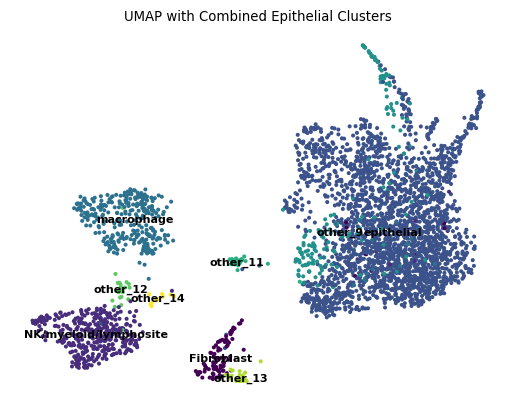

In [76]:
# Create a new column for the combined cell type #Now here i merge all the epithelial cluster to epithelial
adata.obs['combined_cell_type'] = adata.obs['leiden'].apply(lambda x: 'epithelial' if 'epithelial' in x else x)
sc.pl.umap(
    adata, 
    color='combined_cell_type',
    legend_loc='on data', 
    title='UMAP with Combined Epithelial Clusters',  
    frameon=False,
    palette='viridis',
    save='Celltype_Epithelial_mergePCcyst.pdf'# Adjust the palette as needed
)

In [90]:
adata
print(adata.obs.head())


                               Sample_ID                 batch  patients  \
tccaagacggacaagcca  AM31-Combine-1to8_S1  AM31-Combine-1to8_S1  LG.IPMN1   
actgcaattagtgagtga  AM31-Combine-1to8_S1  AM31-Combine-1to8_S1  LG.IPMN1   
tcatcatcgggaaaagaa  AM31-Combine-1to8_S1  AM31-Combine-1to8_S1  LG.IPMN1   
tgaattgttaacagtaaa  AM31-Combine-1to8_S1  AM31-Combine-1to8_S1  LG.IPMN1   
aagtatcgttattagagg  AM31-Combine-1to8_S1  AM31-Combine-1to8_S1  LG.IPMN1   

                   Condition  n_genes  total_counts  pct_counts_mt  \
tccaagacggacaagcca        LG     1491        4196.0            0.0   
actgcaattagtgagtga        LG     1460        3698.0            0.0   
tcatcatcgggaaaagaa        LG     1364        3342.0            0.0   
tgaattgttaacagtaaa        LG     1173        3138.0            0.0   
aagtatcgttattagagg        LG     1368        3081.0            0.0   

                          leiden combined_cell_type  
tccaagacggacaagcca  epithelial_0         epithelial  
actgcaattagtga

ranking genes


/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


    finished (0:00:01)


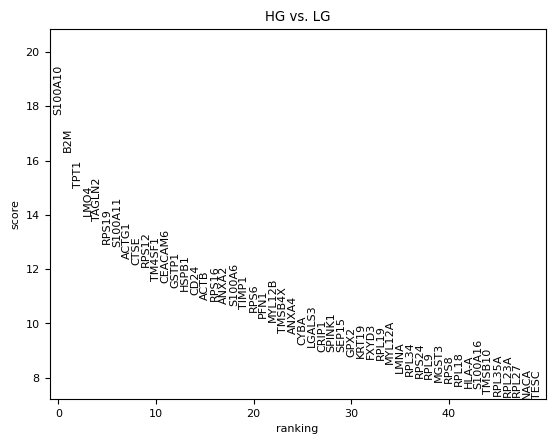

In [280]:
# Differential expression between conditions within the combined epithelial group
epithelial_data = adata[adata.obs['combined_cell_type'] == 'epithelial']

#  compare 'HG' vs 'LG' conditions within this combined epithelial group
sc.tl.rank_genes_groups(epithelial_data, groupby='Condition', groups=['HG'], reference='LG', method='wilcoxon')

# Access and review the differential expression results
sc.pl.rank_genes_groups(epithelial_data, groups=['HG'], n_genes=50)


ranking genes


/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/Users/firoj.mahmud/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


    finished (0:00:01)


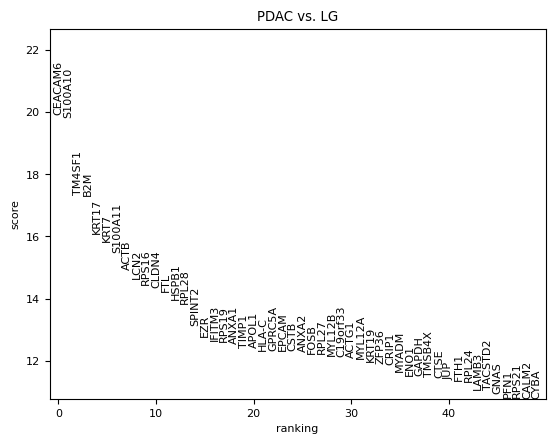

In [281]:
# Differential expression between conditions within the combined epithelial group
epithelial_data = adata[adata.obs['combined_cell_type'] == 'epithelial']

#  compare 'HG' vs 'LG' conditions within this combined epithelial group
sc.tl.rank_genes_groups(epithelial_data, groupby='Condition', groups=['PDAC'], reference='LG', method='wilcoxon')

# Access and review the differential expression results
sc.pl.rank_genes_groups(epithelial_data, groups=['PDAC'], n_genes=50)

In [ ]:
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
from rpy2.robjects import pandas2ri, r
from rpy2.robjects.packages import importr
from rpy2.robjects import Formula

pandas2ri.activate()

epithelial_data = adata[adata.obs['combined_cell_type'] == 'epithelial']

expression_matrix = epithelial_data.to_df().T
conditions = epithelial_data.obs['Condition']

# Import R packages
base = importr('base')
MAST = importr('MAST')
lme4 = importr('lme4')
summarytools = importr('summarytools')

# Create a data frame in R
r_dataframe = pandas2ri.py2rpy(pd.DataFrame({
    'gene': expression_matrix.index,
    'expression': expression_matrix.values.flatten(),
    'condition': np.repeat(conditions.values, expression_matrix.shape[0])
}))

# Convert to a SummarizedExperiment object
se = MAST.SummarizedExperiment(assays=base.list(expression=r_dataframe))

# Perform DE analysis using MAST
zlm_formula = Formula('~ condition')
zlm_model = MAST.zlm(zlm_formula, se)
summary_zlm = summarytools.summary(zlm_model)
coef_table = summary_zlm.rx2('coefC')[1]

de_results = pandas2ri.rpy2py(coef_table)

de_results.to_csv('/path/to/your/output_file.csv', index=False)



'/Users/firoj.mahmud'